# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

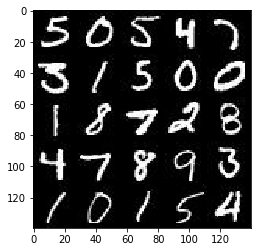

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

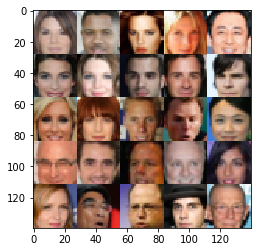

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate_input')
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    keep_prob=0.6
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x1
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(alpha * x1, x1)
        relu1 = tf.contrib.layers.dropout(relu1, keep_prob, is_training=True) 
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True) 
        relu2 = tf.maximum(alpha * bn2, bn2)
        relu2 = tf.contrib.layers.dropout(relu2, keep_prob, is_training=True) 
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        relu3 = tf.contrib.layers.dropout(relu3, keep_prob, is_training=True)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
#         flat = tf.contrib.layers.dropout(flat, keep_prob, is_training=True)
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.0
    reuse = not is_train
    keep_prob = 0.5
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        x1 = tf.contrib.layers.dropout(x1, keep_prob, is_training=is_train) 
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=1, padding='valid',kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        x2 = tf.contrib.layers.dropout(x2, keep_prob, is_training=is_train) 
        # 7x7x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer()) 
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        x3 = tf.contrib.layers.dropout(x3, keep_prob, is_training=is_train) 
        # 14x14x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        # 28x28x1 now
        
        out = tf.tanh(logits)
        
        return out    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    smooth = 0.1
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
#     saver = tf.train.Saver()
    print_every=100 
    show_every=100
    samples, losses = [], []
    steps = 0
    
    input_real, input_z, learning_rate_input = model_inputs(data_shape[-3], data_shape[-2], data_shape[-1], z_dim)    
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[-1])    
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate_input, beta1)    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            saver = tf.train.Saver()
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
#                 batch_images = batch_images[0].reshape((batch_size, 784))
                batch_images = batch_images*2
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_input: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, learning_rate_input: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, learning_rate_input: learning_rate})
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[-1], data_image_mode)

#             saver.save(sess, './checkpoints/generator_{:02d}.ckpt'.format(epoch_i))

#     with open('samples.pkl', 'wb') as f:
#         pkl.dump(samples, f)
    
    return losses, samples                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.2308... Generator Loss: 2.4433


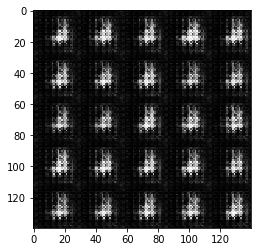

Epoch 1/2... Discriminator Loss: 1.1385... Generator Loss: 1.0110


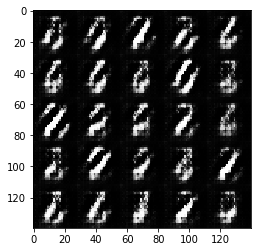

Epoch 1/2... Discriminator Loss: 1.6902... Generator Loss: 1.2407


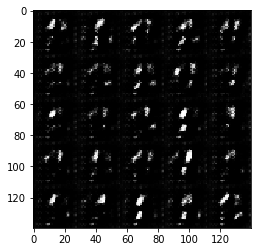

Epoch 1/2... Discriminator Loss: 1.6180... Generator Loss: 1.1948


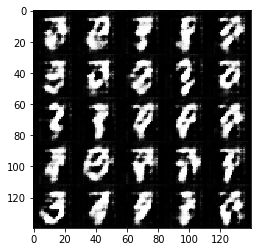

Epoch 1/2... Discriminator Loss: 1.7692... Generator Loss: 0.9619


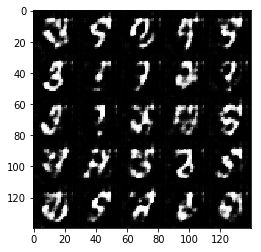

Epoch 1/2... Discriminator Loss: 1.2149... Generator Loss: 1.1925


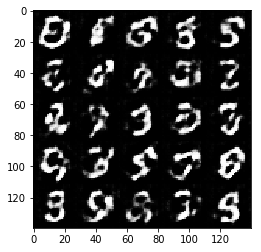

Epoch 1/2... Discriminator Loss: 1.4591... Generator Loss: 0.8913


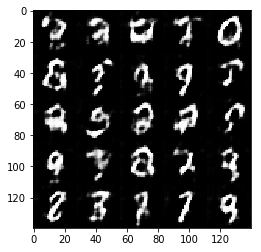

Epoch 1/2... Discriminator Loss: 1.5016... Generator Loss: 0.9713


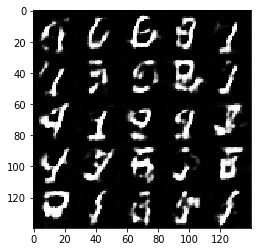

Epoch 1/2... Discriminator Loss: 1.2342... Generator Loss: 0.9678


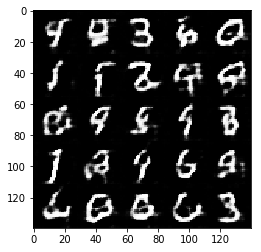

Epoch 1/2... Discriminator Loss: 1.5565... Generator Loss: 0.6590


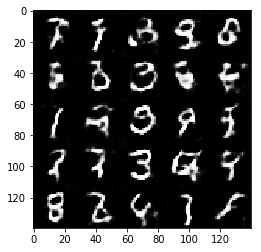

Epoch 1/2... Discriminator Loss: 1.1802... Generator Loss: 0.8818


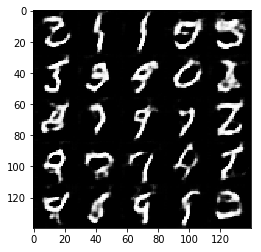

Epoch 1/2... Discriminator Loss: 1.4041... Generator Loss: 0.9021


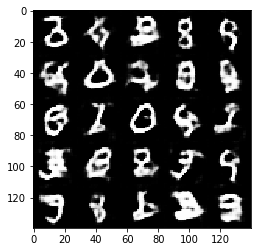

Epoch 1/2... Discriminator Loss: 1.2196... Generator Loss: 0.9490


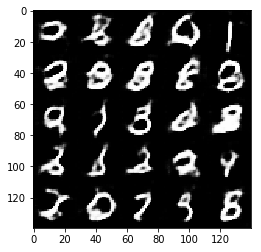

Epoch 1/2... Discriminator Loss: 1.1571... Generator Loss: 0.6992


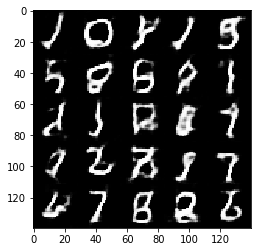

Epoch 1/2... Discriminator Loss: 1.3254... Generator Loss: 1.1146


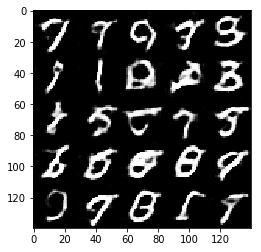

Epoch 1/2... Discriminator Loss: 1.3376... Generator Loss: 0.8317


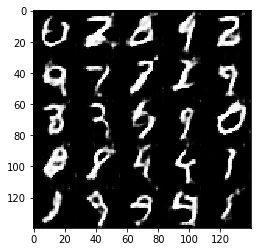

Epoch 1/2... Discriminator Loss: 1.2852... Generator Loss: 0.9649


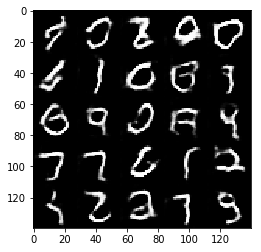

Epoch 1/2... Discriminator Loss: 1.2096... Generator Loss: 1.0609


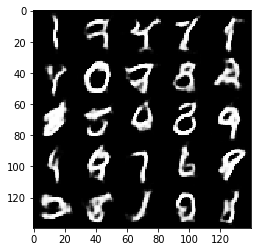

Epoch 1/2... Discriminator Loss: 1.3656... Generator Loss: 0.9753


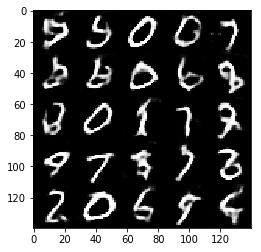

Epoch 1/2... Discriminator Loss: 1.2933... Generator Loss: 0.8229


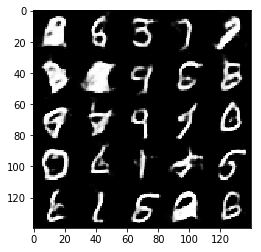

Epoch 1/2... Discriminator Loss: 1.3811... Generator Loss: 0.8384


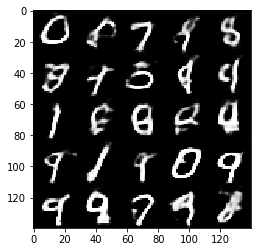

Epoch 1/2... Discriminator Loss: 1.2562... Generator Loss: 1.0548


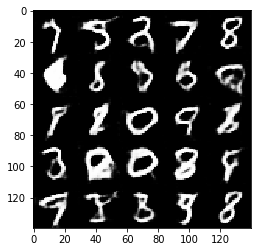

Epoch 1/2... Discriminator Loss: 1.4775... Generator Loss: 0.8297


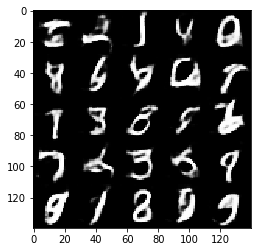

Epoch 1/2... Discriminator Loss: 1.3146... Generator Loss: 1.1459


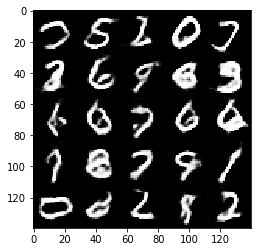

Epoch 1/2... Discriminator Loss: 1.2333... Generator Loss: 0.9475


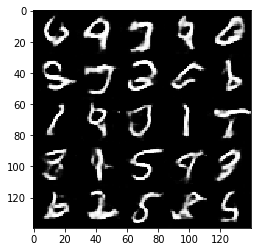

Epoch 1/2... Discriminator Loss: 1.0620... Generator Loss: 1.0107


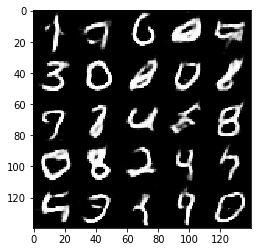

Epoch 1/2... Discriminator Loss: 1.4248... Generator Loss: 0.7944


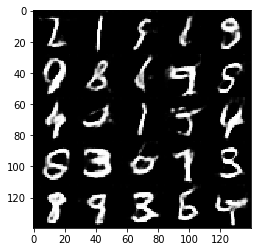

Epoch 1/2... Discriminator Loss: 1.5584... Generator Loss: 0.8119


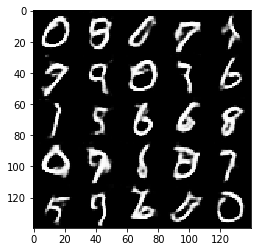

Epoch 1/2... Discriminator Loss: 1.2643... Generator Loss: 1.0678


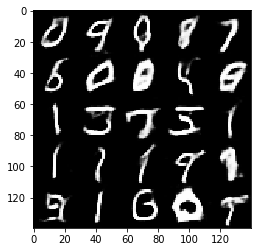

Epoch 1/2... Discriminator Loss: 1.2795... Generator Loss: 1.0145


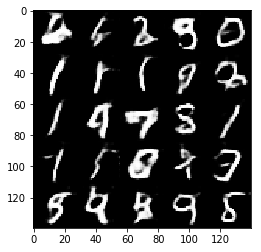

Epoch 1/2... Discriminator Loss: 1.4750... Generator Loss: 0.9320


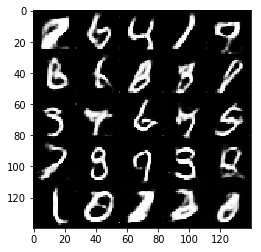

Epoch 1/2... Discriminator Loss: 1.1838... Generator Loss: 0.9991


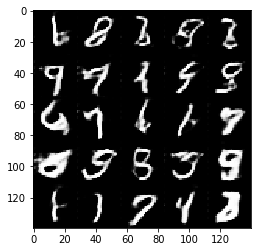

Epoch 1/2... Discriminator Loss: 1.2865... Generator Loss: 1.0860


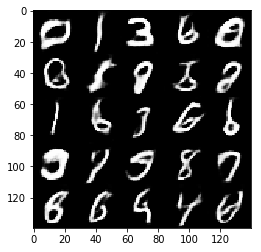

Epoch 1/2... Discriminator Loss: 1.0779... Generator Loss: 1.0315


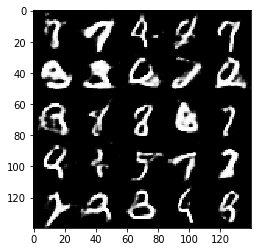

Epoch 1/2... Discriminator Loss: 1.1246... Generator Loss: 1.0395


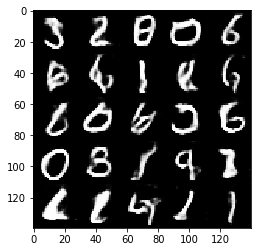

Epoch 1/2... Discriminator Loss: 1.1901... Generator Loss: 0.6420


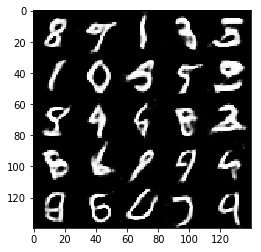

Epoch 1/2... Discriminator Loss: 1.3879... Generator Loss: 1.0212


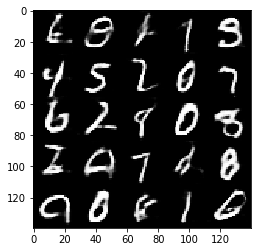

Epoch 2/2... Discriminator Loss: 1.2876... Generator Loss: 0.7788


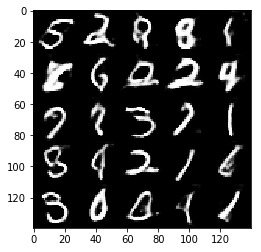

Epoch 2/2... Discriminator Loss: 1.3752... Generator Loss: 0.9181


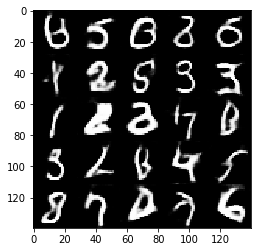

Epoch 2/2... Discriminator Loss: 1.2529... Generator Loss: 0.7655


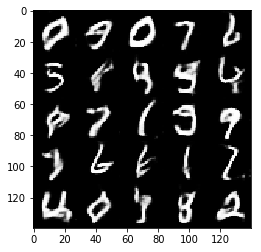

Epoch 2/2... Discriminator Loss: 1.4131... Generator Loss: 1.1920


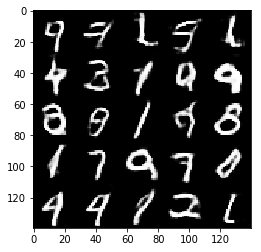

Epoch 2/2... Discriminator Loss: 1.1804... Generator Loss: 1.2273


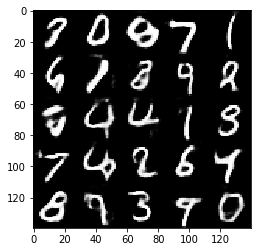

Epoch 2/2... Discriminator Loss: 1.1635... Generator Loss: 1.1486


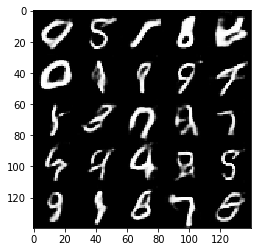

Epoch 2/2... Discriminator Loss: 1.0519... Generator Loss: 1.1558


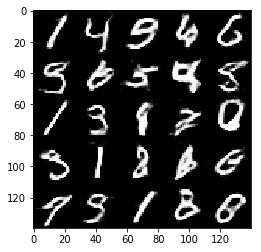

Epoch 2/2... Discriminator Loss: 1.2345... Generator Loss: 0.6954


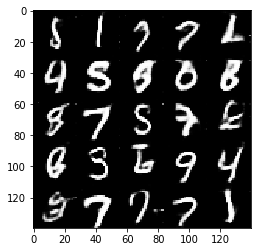

Epoch 2/2... Discriminator Loss: 1.4502... Generator Loss: 1.0611


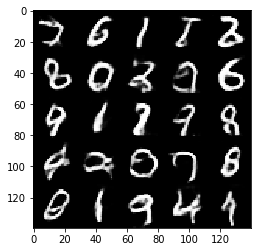

Epoch 2/2... Discriminator Loss: 1.2234... Generator Loss: 0.9842


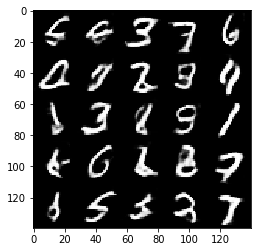

Epoch 2/2... Discriminator Loss: 1.3129... Generator Loss: 1.0188


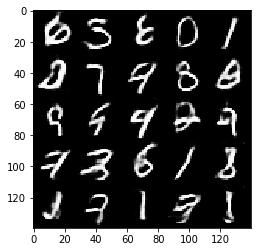

Epoch 2/2... Discriminator Loss: 1.2856... Generator Loss: 1.0126


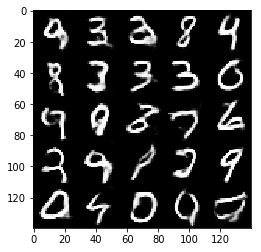

Epoch 2/2... Discriminator Loss: 1.6383... Generator Loss: 0.8133


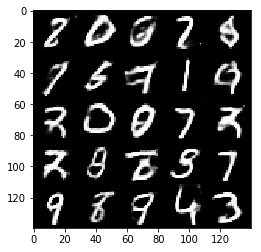

Epoch 2/2... Discriminator Loss: 1.3872... Generator Loss: 0.9116


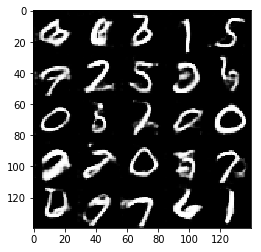

Epoch 2/2... Discriminator Loss: 1.2478... Generator Loss: 1.1892


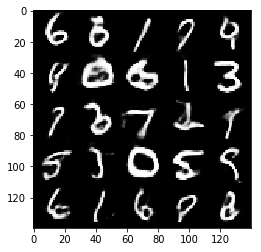

Epoch 2/2... Discriminator Loss: 1.3454... Generator Loss: 0.8469


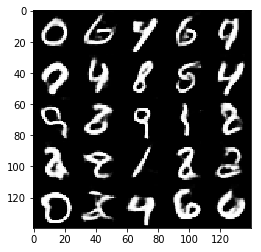

Epoch 2/2... Discriminator Loss: 1.1029... Generator Loss: 1.3545


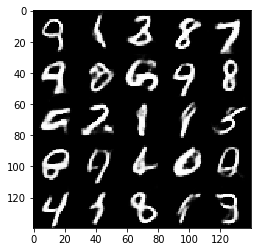

Epoch 2/2... Discriminator Loss: 1.2324... Generator Loss: 1.0222


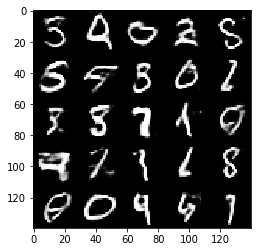

Epoch 2/2... Discriminator Loss: 1.3330... Generator Loss: 0.8403


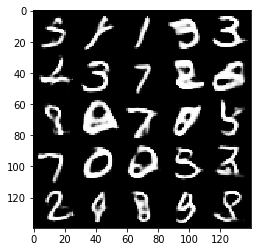

Epoch 2/2... Discriminator Loss: 1.2546... Generator Loss: 0.8830


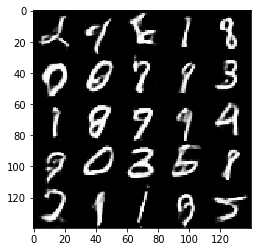

Epoch 2/2... Discriminator Loss: 1.3502... Generator Loss: 1.0151


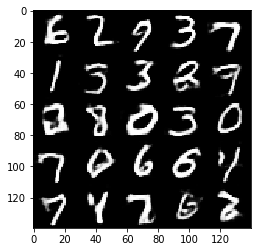

Epoch 2/2... Discriminator Loss: 1.3373... Generator Loss: 0.9211


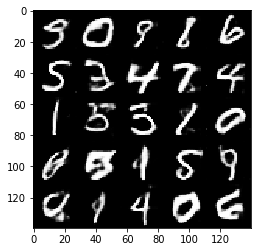

Epoch 2/2... Discriminator Loss: 1.1196... Generator Loss: 1.0915


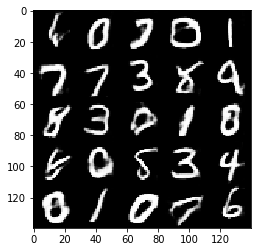

Epoch 2/2... Discriminator Loss: 1.0589... Generator Loss: 1.0689


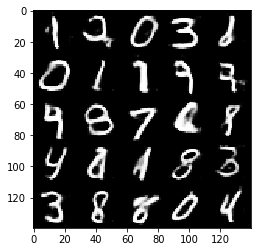

Epoch 2/2... Discriminator Loss: 1.0418... Generator Loss: 0.9479


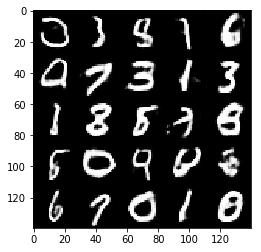

Epoch 2/2... Discriminator Loss: 1.1652... Generator Loss: 1.2967


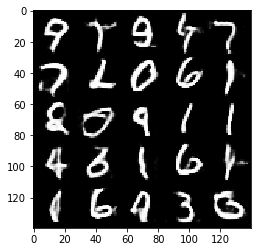

Epoch 2/2... Discriminator Loss: 1.2106... Generator Loss: 0.8071


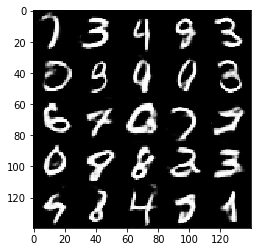

Epoch 2/2... Discriminator Loss: 1.1274... Generator Loss: 0.9812


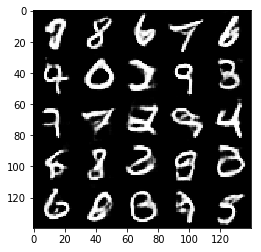

Epoch 2/2... Discriminator Loss: 1.0972... Generator Loss: 1.0259


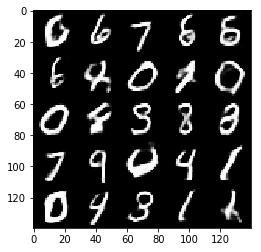

Epoch 2/2... Discriminator Loss: 1.1820... Generator Loss: 1.7449


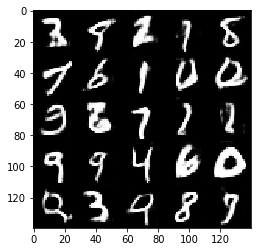

Epoch 2/2... Discriminator Loss: 1.3662... Generator Loss: 0.5401


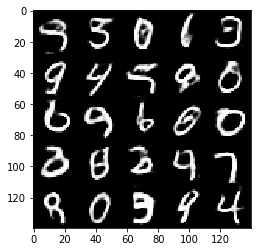

Epoch 2/2... Discriminator Loss: 1.1813... Generator Loss: 1.2838


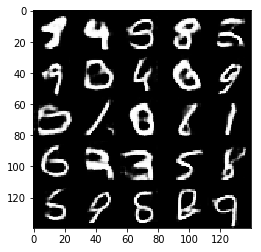

Epoch 2/2... Discriminator Loss: 1.2560... Generator Loss: 1.1429


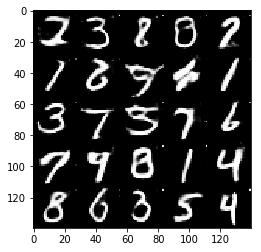

Epoch 2/2... Discriminator Loss: 1.1282... Generator Loss: 1.3717


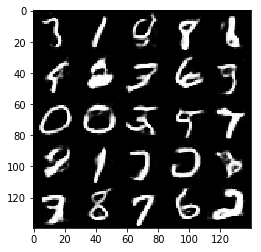

Epoch 2/2... Discriminator Loss: 1.3056... Generator Loss: 1.4494


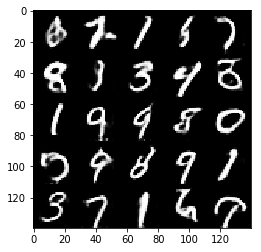

Epoch 2/2... Discriminator Loss: 1.4189... Generator Loss: 0.7991


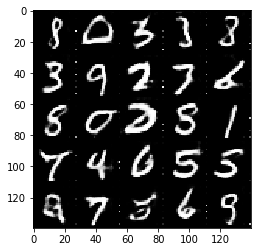

Epoch 2/2... Discriminator Loss: 1.1961... Generator Loss: 0.7640


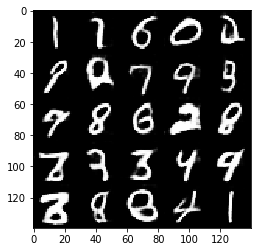

Epoch 2/2... Discriminator Loss: 0.9313... Generator Loss: 1.5281


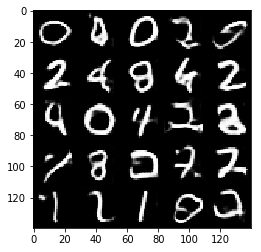

In [12]:
batch_size = 16
z_dim = 100
learning_rate = 0.0003
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.8931... Generator Loss: 2.1464


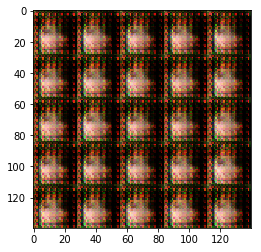

Epoch 1/1... Discriminator Loss: 0.4985... Generator Loss: 3.4365


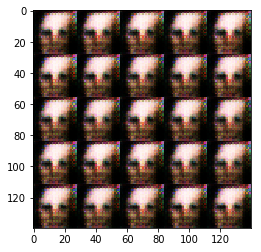

Epoch 1/1... Discriminator Loss: 0.6600... Generator Loss: 1.5466


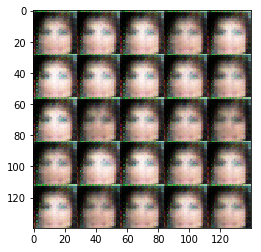

Epoch 1/1... Discriminator Loss: 1.3002... Generator Loss: 0.9157


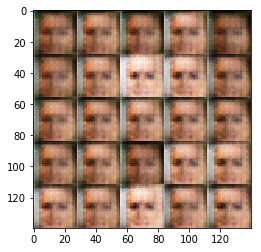

Epoch 1/1... Discriminator Loss: 1.1082... Generator Loss: 1.3066


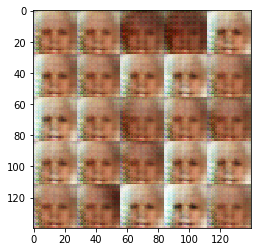

Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.9242


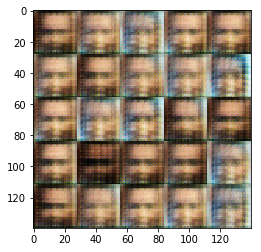

Epoch 1/1... Discriminator Loss: 1.1228... Generator Loss: 1.0588


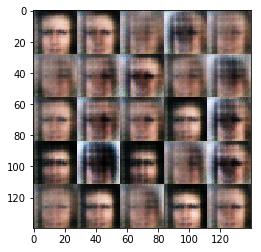

Epoch 1/1... Discriminator Loss: 1.2400... Generator Loss: 0.9134


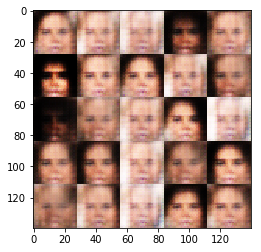

Epoch 1/1... Discriminator Loss: 1.3861... Generator Loss: 1.2294


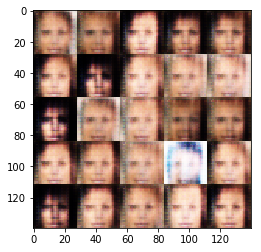

Epoch 1/1... Discriminator Loss: 1.0601... Generator Loss: 0.9710


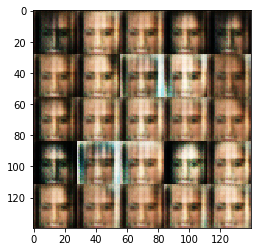

Epoch 1/1... Discriminator Loss: 1.7480... Generator Loss: 0.7756


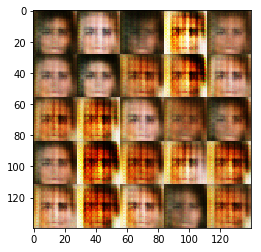

Epoch 1/1... Discriminator Loss: 1.2352... Generator Loss: 0.9836


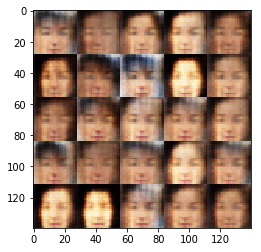

Epoch 1/1... Discriminator Loss: 1.2083... Generator Loss: 1.3413


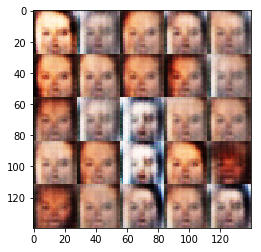

Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.9228


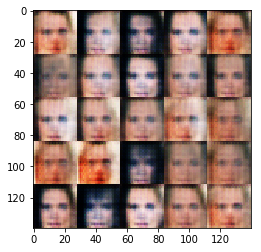

Epoch 1/1... Discriminator Loss: 1.6532... Generator Loss: 0.8981


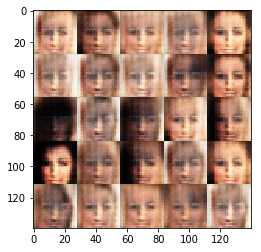

Epoch 1/1... Discriminator Loss: 1.5194... Generator Loss: 0.5298


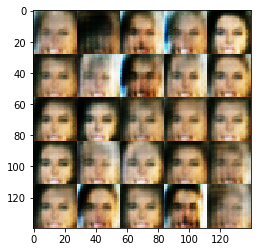

Epoch 1/1... Discriminator Loss: 1.5757... Generator Loss: 0.8904


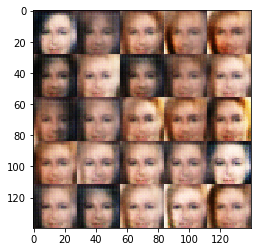

Epoch 1/1... Discriminator Loss: 1.5734... Generator Loss: 0.8387


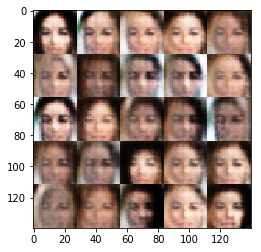

Epoch 1/1... Discriminator Loss: 1.3147... Generator Loss: 1.1065


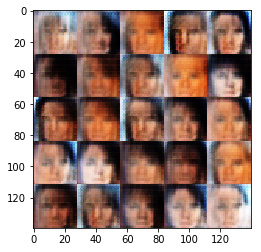

Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.8359


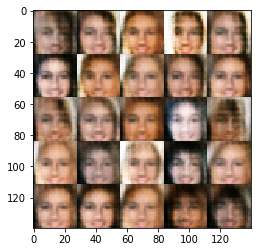

Epoch 1/1... Discriminator Loss: 1.3132... Generator Loss: 0.6724


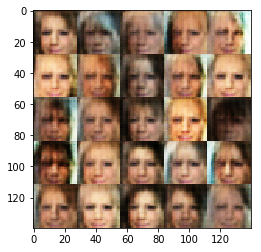

Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 0.8896


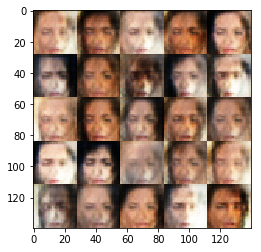

Epoch 1/1... Discriminator Loss: 1.3223... Generator Loss: 0.7725


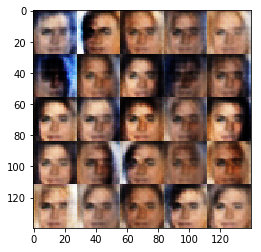

Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 0.6519


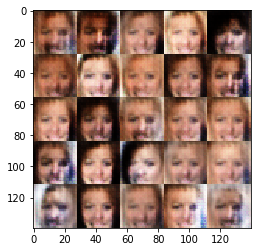

Epoch 1/1... Discriminator Loss: 1.4099... Generator Loss: 0.9341


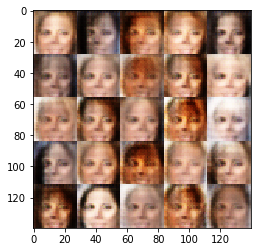

Epoch 1/1... Discriminator Loss: 1.2631... Generator Loss: 0.9695


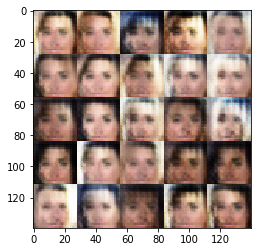

Epoch 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.8413


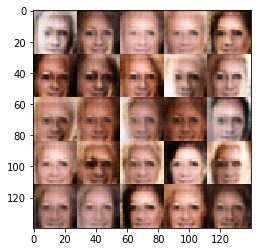

Epoch 1/1... Discriminator Loss: 1.4331... Generator Loss: 0.7544


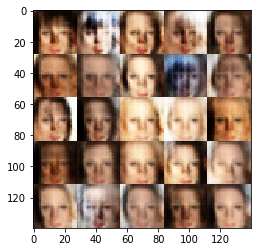

Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.8030


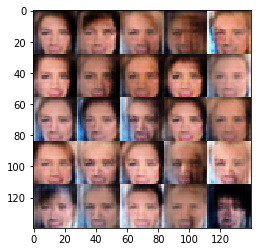

Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.7928


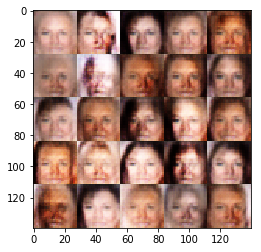

Epoch 1/1... Discriminator Loss: 1.4283... Generator Loss: 0.8751


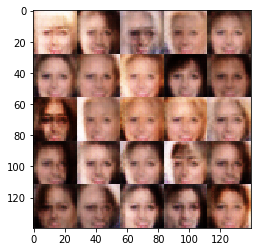

Epoch 1/1... Discriminator Loss: 1.3655... Generator Loss: 0.9353


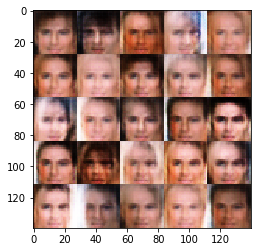

Epoch 1/1... Discriminator Loss: 1.4155... Generator Loss: 0.8600


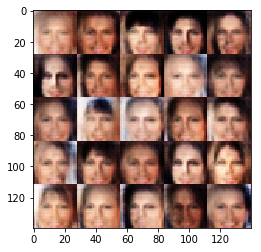

Epoch 1/1... Discriminator Loss: 1.5369... Generator Loss: 0.9190


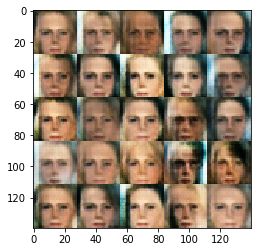

Epoch 1/1... Discriminator Loss: 1.3564... Generator Loss: 0.8012


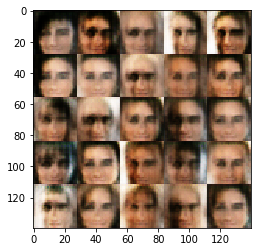

Epoch 1/1... Discriminator Loss: 1.4965... Generator Loss: 0.5587


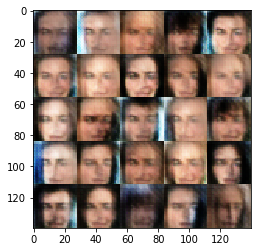

Epoch 1/1... Discriminator Loss: 1.4373... Generator Loss: 0.7840


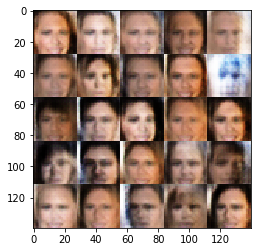

Epoch 1/1... Discriminator Loss: 1.3725... Generator Loss: 0.9789


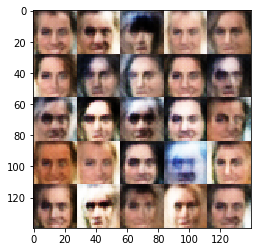

Epoch 1/1... Discriminator Loss: 1.3203... Generator Loss: 0.6712


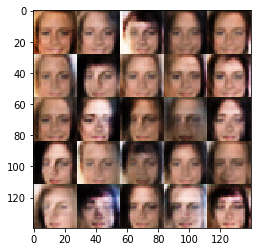

Epoch 1/1... Discriminator Loss: 1.3835... Generator Loss: 0.8549


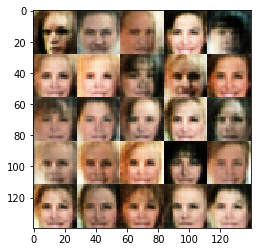

Epoch 1/1... Discriminator Loss: 1.4527... Generator Loss: 0.6364


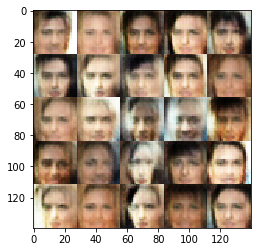

Epoch 1/1... Discriminator Loss: 1.4291... Generator Loss: 0.9757


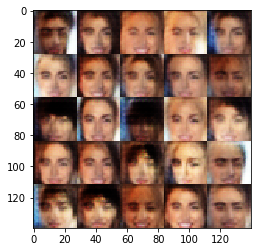

Epoch 1/1... Discriminator Loss: 1.4119... Generator Loss: 0.8758


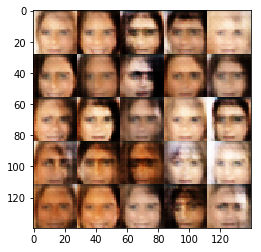

Epoch 1/1... Discriminator Loss: 1.3223... Generator Loss: 0.8302


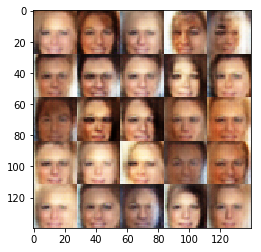

Epoch 1/1... Discriminator Loss: 1.4506... Generator Loss: 0.6607


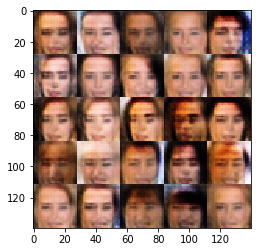

Epoch 1/1... Discriminator Loss: 1.3400... Generator Loss: 0.8083


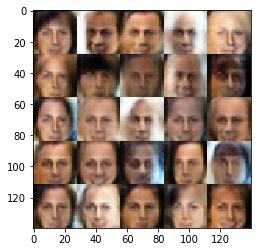

Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.7822


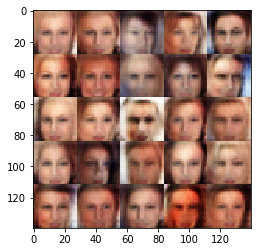

Epoch 1/1... Discriminator Loss: 1.3898... Generator Loss: 0.7862


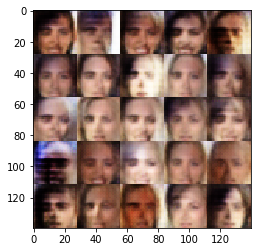

Epoch 1/1... Discriminator Loss: 1.4662... Generator Loss: 0.6721


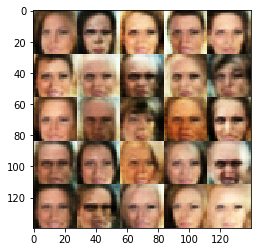

Epoch 1/1... Discriminator Loss: 1.3856... Generator Loss: 0.7623


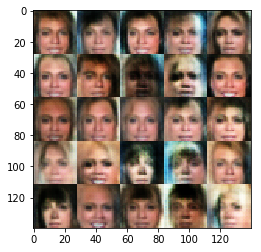

Epoch 1/1... Discriminator Loss: 1.3896... Generator Loss: 1.0011


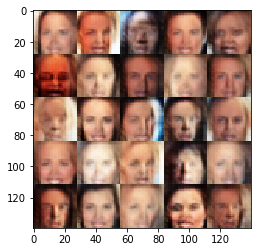

Epoch 1/1... Discriminator Loss: 1.4640... Generator Loss: 0.6807


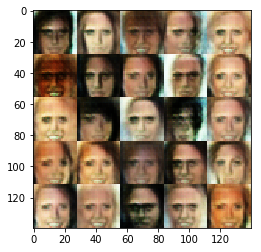

Epoch 1/1... Discriminator Loss: 1.3769... Generator Loss: 0.8839


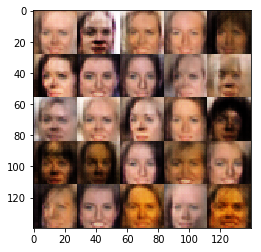

Epoch 1/1... Discriminator Loss: 1.4446... Generator Loss: 0.8471


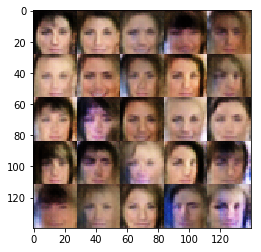

Epoch 1/1... Discriminator Loss: 1.4488... Generator Loss: 0.9160


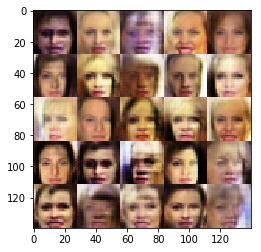

Epoch 1/1... Discriminator Loss: 1.4864... Generator Loss: 0.8825


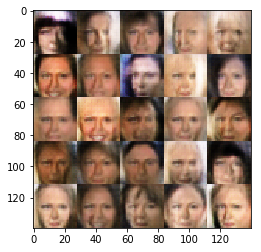

Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.9540


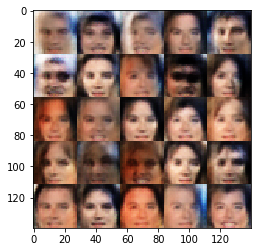

Epoch 1/1... Discriminator Loss: 1.2803... Generator Loss: 0.7284


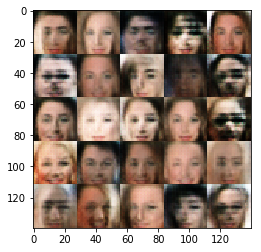

Epoch 1/1... Discriminator Loss: 1.4226... Generator Loss: 0.8388


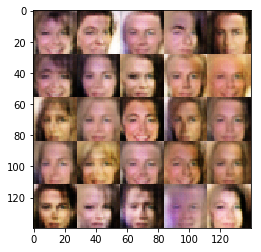

Epoch 1/1... Discriminator Loss: 1.4157... Generator Loss: 0.8996


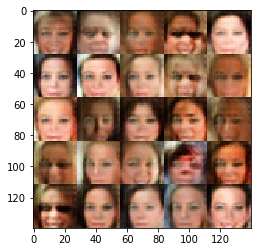

Epoch 1/1... Discriminator Loss: 1.3675... Generator Loss: 0.9570


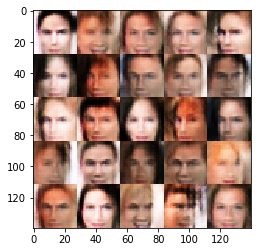

Epoch 1/1... Discriminator Loss: 1.2886... Generator Loss: 1.0831


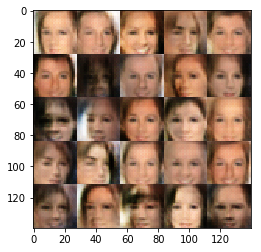

Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.8672


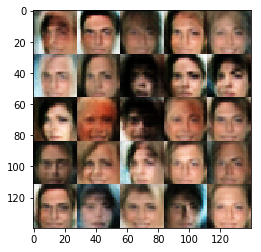

Epoch 1/1... Discriminator Loss: 1.2976... Generator Loss: 0.9041


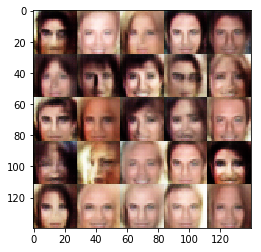

Epoch 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.7478


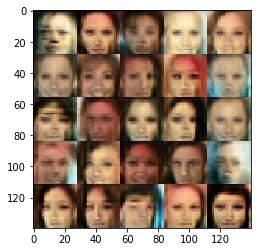

Epoch 1/1... Discriminator Loss: 1.4996... Generator Loss: 0.8798


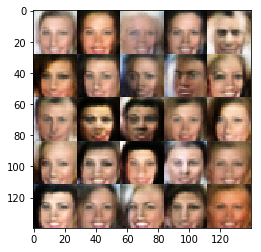

Epoch 1/1... Discriminator Loss: 1.3518... Generator Loss: 0.7719


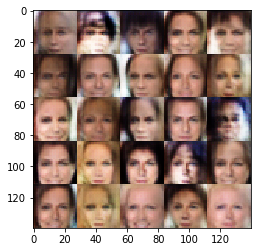

Epoch 1/1... Discriminator Loss: 1.4177... Generator Loss: 0.7288


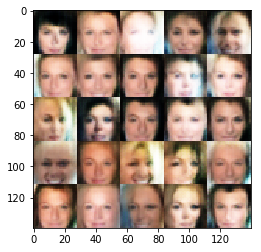

Epoch 1/1... Discriminator Loss: 1.3661... Generator Loss: 0.9231


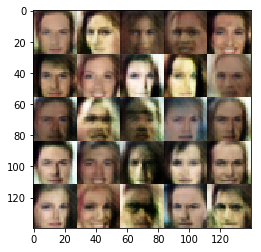

Epoch 1/1... Discriminator Loss: 1.2889... Generator Loss: 0.9652


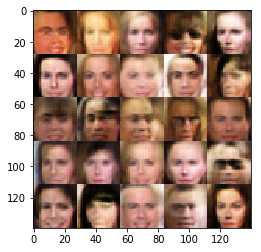

Epoch 1/1... Discriminator Loss: 1.3829... Generator Loss: 0.8605


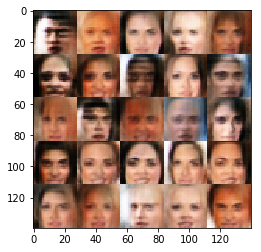

Epoch 1/1... Discriminator Loss: 1.3312... Generator Loss: 0.6988


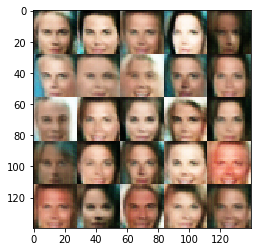

Epoch 1/1... Discriminator Loss: 1.5316... Generator Loss: 0.6844


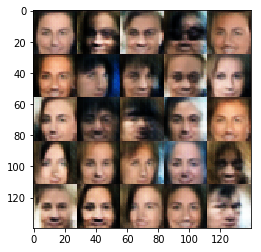

Epoch 1/1... Discriminator Loss: 1.2056... Generator Loss: 0.8168


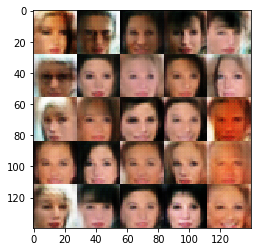

Epoch 1/1... Discriminator Loss: 1.3392... Generator Loss: 0.8414


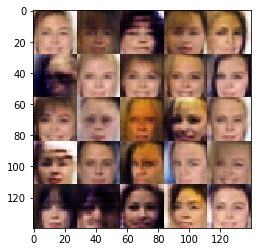

Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.8360


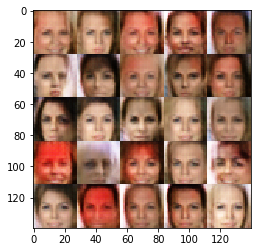

Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.7595


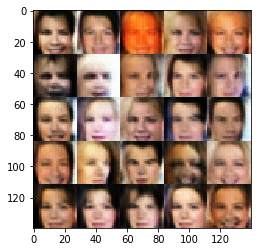

Epoch 1/1... Discriminator Loss: 1.4519... Generator Loss: 0.7895


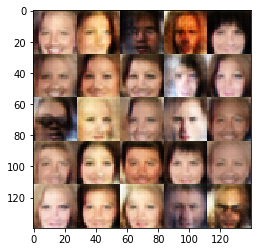

Epoch 1/1... Discriminator Loss: 1.2311... Generator Loss: 1.0281


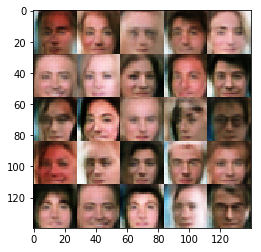

Epoch 1/1... Discriminator Loss: 1.3552... Generator Loss: 1.0413


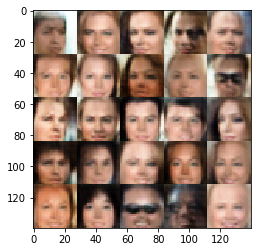

Epoch 1/1... Discriminator Loss: 1.2670... Generator Loss: 0.9688


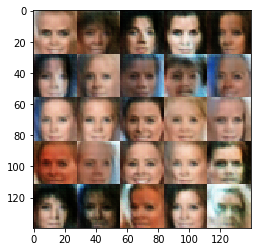

Epoch 1/1... Discriminator Loss: 1.4655... Generator Loss: 0.6322


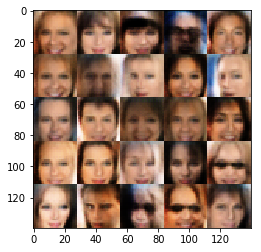

Epoch 1/1... Discriminator Loss: 1.2819... Generator Loss: 0.8069


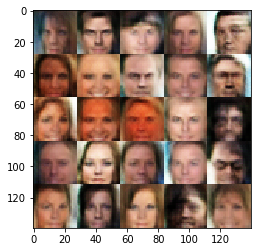

Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.8281


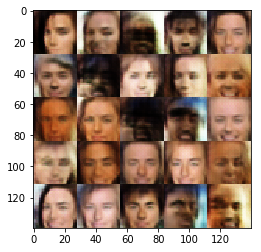

Epoch 1/1... Discriminator Loss: 1.3702... Generator Loss: 0.9143


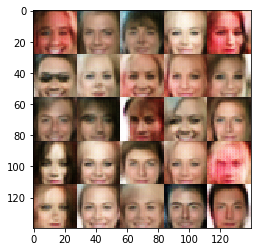

Epoch 1/1... Discriminator Loss: 1.4119... Generator Loss: 0.8777


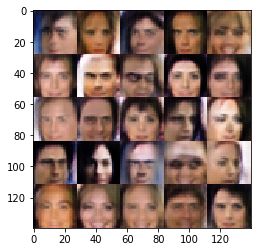

Epoch 1/1... Discriminator Loss: 1.3943... Generator Loss: 0.8781


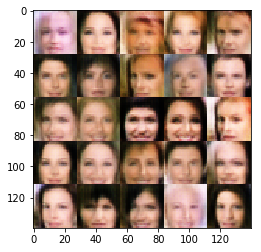

Epoch 1/1... Discriminator Loss: 1.1625... Generator Loss: 1.0737


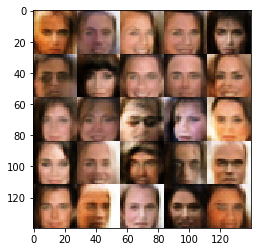

Epoch 1/1... Discriminator Loss: 1.4094... Generator Loss: 0.8917


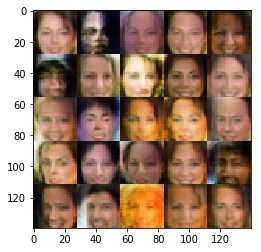

Epoch 1/1... Discriminator Loss: 1.2666... Generator Loss: 0.9665


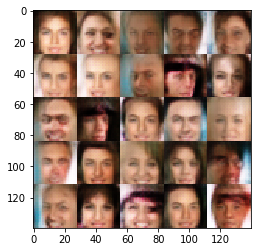

Epoch 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.9441


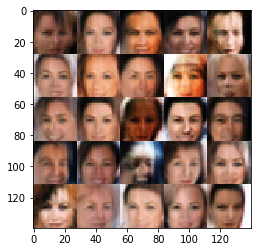

Epoch 1/1... Discriminator Loss: 1.1904... Generator Loss: 0.8980


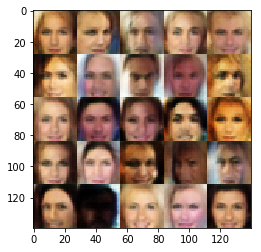

Epoch 1/1... Discriminator Loss: 1.3935... Generator Loss: 0.8945


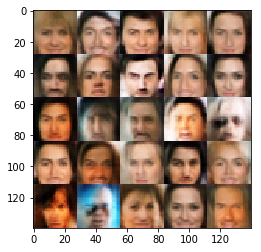

Epoch 1/1... Discriminator Loss: 1.2963... Generator Loss: 1.0495


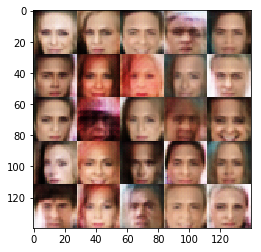

Epoch 1/1... Discriminator Loss: 1.3242... Generator Loss: 0.6799


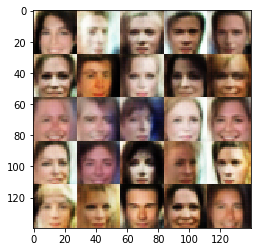

Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 1.0474


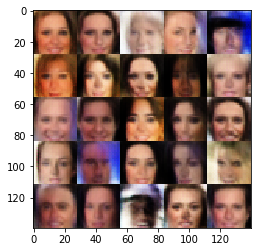

Epoch 1/1... Discriminator Loss: 1.1336... Generator Loss: 1.1240


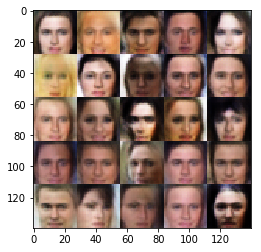

Epoch 1/1... Discriminator Loss: 1.1948... Generator Loss: 0.8025


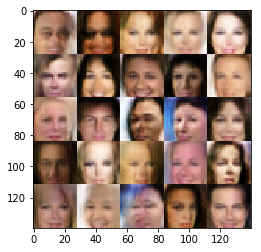

Epoch 1/1... Discriminator Loss: 1.1991... Generator Loss: 1.0973


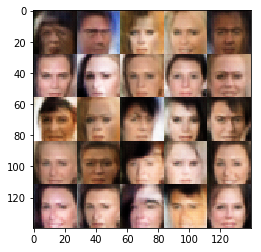

Epoch 1/1... Discriminator Loss: 1.2651... Generator Loss: 0.8061


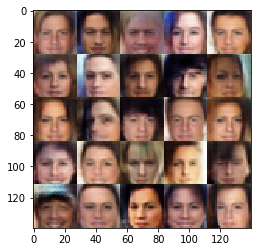

Epoch 1/1... Discriminator Loss: 1.2809... Generator Loss: 1.0681


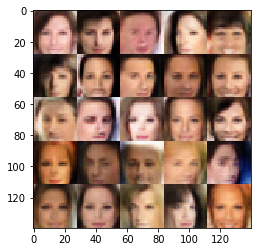

Epoch 1/1... Discriminator Loss: 1.0256... Generator Loss: 1.2066


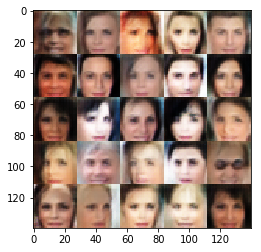

Epoch 1/1... Discriminator Loss: 1.1205... Generator Loss: 0.9922


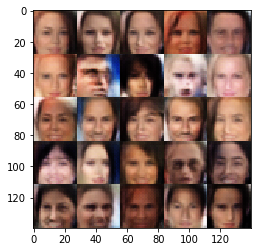

Epoch 1/1... Discriminator Loss: 1.2574... Generator Loss: 1.0508


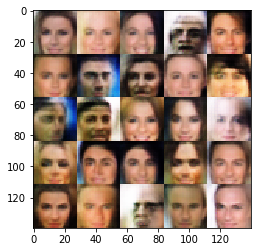

Epoch 1/1... Discriminator Loss: 1.3702... Generator Loss: 1.0671


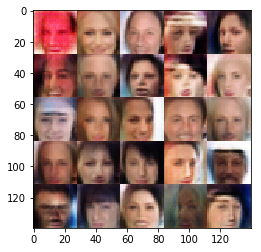

Epoch 1/1... Discriminator Loss: 1.1600... Generator Loss: 1.0158


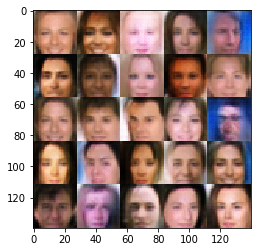

Epoch 1/1... Discriminator Loss: 1.3502... Generator Loss: 0.9539


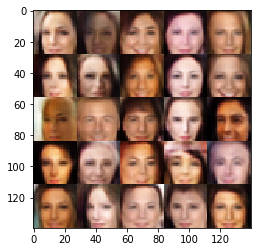

Epoch 1/1... Discriminator Loss: 1.1733... Generator Loss: 0.7400


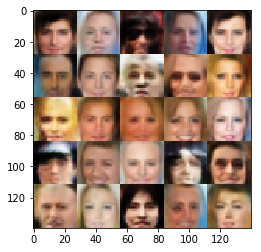

Epoch 1/1... Discriminator Loss: 1.1213... Generator Loss: 0.9466


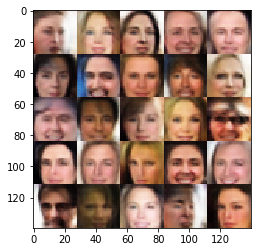

Epoch 1/1... Discriminator Loss: 1.0902... Generator Loss: 1.2442


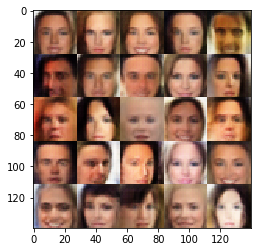

Epoch 1/1... Discriminator Loss: 1.2640... Generator Loss: 1.0633


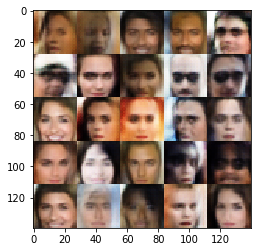

Epoch 1/1... Discriminator Loss: 1.4418... Generator Loss: 0.9225


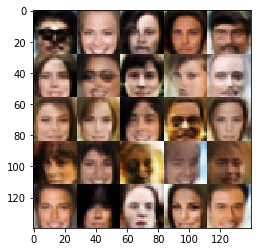

Epoch 1/1... Discriminator Loss: 1.3691... Generator Loss: 0.8869


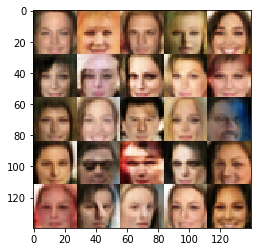

Epoch 1/1... Discriminator Loss: 1.3012... Generator Loss: 0.7009


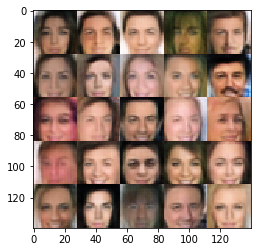

Epoch 1/1... Discriminator Loss: 1.2225... Generator Loss: 1.0437


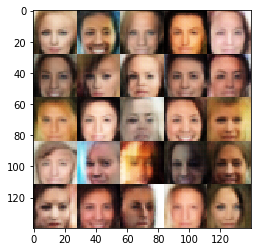

Epoch 1/1... Discriminator Loss: 1.2036... Generator Loss: 1.2263


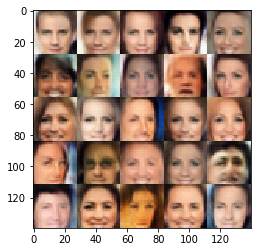

Epoch 1/1... Discriminator Loss: 1.4285... Generator Loss: 0.9575


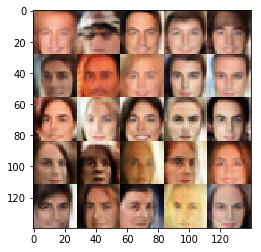

Epoch 1/1... Discriminator Loss: 1.3116... Generator Loss: 0.8610


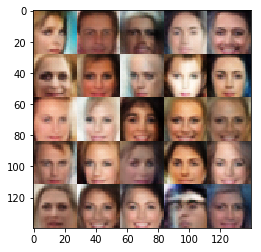

Epoch 1/1... Discriminator Loss: 1.4473... Generator Loss: 1.3558


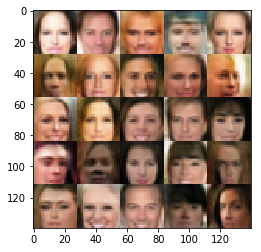

Epoch 1/1... Discriminator Loss: 1.2804... Generator Loss: 0.9820


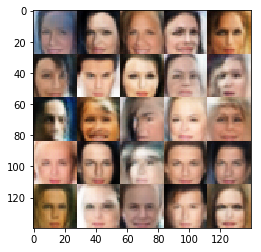

Epoch 1/1... Discriminator Loss: 1.3233... Generator Loss: 0.8453


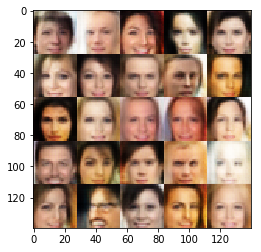

Epoch 1/1... Discriminator Loss: 1.1337... Generator Loss: 0.9455


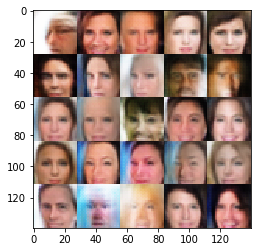

Epoch 1/1... Discriminator Loss: 1.2022... Generator Loss: 1.0429


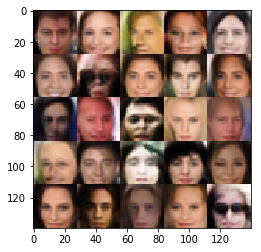

Epoch 1/1... Discriminator Loss: 1.1865... Generator Loss: 1.1664


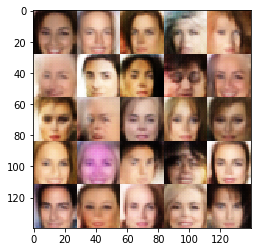

Epoch 1/1... Discriminator Loss: 1.1149... Generator Loss: 0.8832


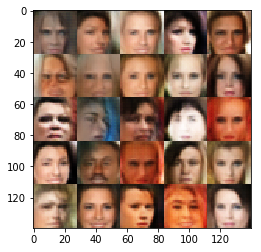

Epoch 1/1... Discriminator Loss: 1.0232... Generator Loss: 1.0783


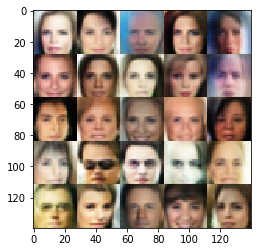

In [13]:
batch_size = 16
z_dim = 100
learning_rate = 0.0003
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.